In [1]:
# Importing packages
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torchmetrics
import torchinfo
import torch.nn.functional as F
import cv2

In [2]:
# Data pathes
train_images = 'data/Massachusetts/tiff/train'
train_labels = 'data/Massachusetts/tiff/train_labels'
val_images = 'data/Massachusetts/tiff/val'
val_labels = 'data/Massachusetts/tiff/val_labels'
test_images = 'data/Massachusetts/tiff/test'
test_labels = 'data/Massachusetts/tiff/test_labels'

In [3]:
# Hyperparams
DEVICE = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
IN_CHANNELS = 3
CLASSES = 2
TRAIN_BATCH = 8
VALID_BATCH = 2
NUM_WORKERS = 8
LR = 0.001
EPOCHS = 100

In [4]:
# Train and test augmentations

A_train = A.Compose([#A.Resize(224, 224, interpolation=cv2.INTER_NEAREST), 
                     A.RandomCrop(height=256, width=256, always_apply=True),
                     A.OneOf([
                       A.VerticalFlip(p=1),
                       A.HorizontalFlip(p=1),
                       A.RandomRotate90(p=1)], p=1),  
#                     A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                     A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
                  ToTensorV2()])


A_val =  A.Compose([ #A.Resize(224, 224, interpolation=cv2.INTER_NEAREST),
                    A.PadIfNeeded(min_height=1504, min_width=1504, always_apply=True, border_mode=0),
                   A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
#                      A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                    
                   ToTensorV2()])

In [5]:
# Dataset class
class MassachussetsDataset(Dataset):
    def __init__(self, img_path, mask_path, transforms=None):
        super().__init__()
        self.img_path = img_path
        self.mask_path = mask_path
        self.transforms = transforms
        self.images_list = os.listdir(img_path)

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, index):
        image = np.array(Image.open(os.path.join(self.img_path, self.images_list[index])).convert("RGB"))
        mask = np.array(Image.open(os.path.join(self.mask_path, self.images_list[index].replace('.tiff', '.tif'))).convert("L"), dtype=np.float32)
        mask[mask==255] = 1.0

        if self.transforms is not None:
            aug  = self.transforms(image=image, mask=mask)
            image = aug['image']
            mask = aug['mask']
            

        return image, mask

In [6]:
# Datasets and Dataloaders

train_set = MassachussetsDataset(train_images, train_labels, transforms=A_train)
valid_set = MassachussetsDataset(val_images, val_labels, transforms=A_val)
test_set = MassachussetsDataset(test_images, test_labels, transforms=A_val)


train_loader = DataLoader(train_set, shuffle=True, batch_size=TRAIN_BATCH, num_workers=NUM_WORKERS)
valid_loader = DataLoader(valid_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)
test_loader = DataLoader(test_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)

In [7]:
img, mask = train_set[2]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


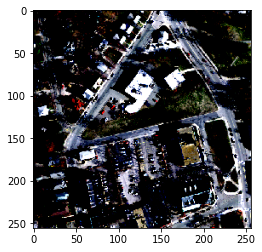

In [8]:
plt.imshow(img.permute(1, 2, 0))

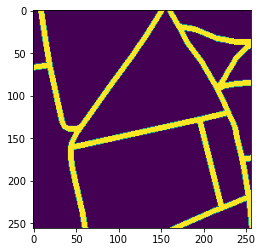

In [9]:
plt.imshow(mask)

In [10]:
print(np.unique(mask))

[0. 1.]


In [11]:
model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=False, num_classes=1).to(DEVICE)
from torchinfo import summary

# batch_size = 8
# summary(model, input_size=(batch_size, 3, 256, 256))

In [12]:
# Custom loss functions
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice
    
#####################################################################################    
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE
#####################################################################################    
class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoULoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = (intersection + smooth)/(union + smooth)
                
        return 1 - IoU
    
#####################################################################################    
ALPHA = 0.8
GAMMA = 2

class FocalLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(FocalLoss, self).__init__()

    def forward(self, inputs, targets, alpha=0.8, gamma=2, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #first compute binary cross-entropy 
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        BCE_EXP = torch.exp(-BCE)
        focal_loss = alpha * (1-BCE_EXP)**gamma * BCE
                       
        return focal_loss
    
    
#####################################################################################
ALPHA = 0.5
BETA = 0.5

class TverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(TverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=ALPHA, beta=BETA):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()    
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
       
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        
        return 1 - Tversky

In [13]:
# criterion = nn.BCEWithLogitsLoss().to(DEVICE)
# criterion = DiceLoss().to(DEVICE)
criterion = DiceBCELoss().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)

In [14]:
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=CLASSES):
    with torch.no_grad():
        pred_mask = nn.functional.sigmoid(pred_mask)
        pred_mask = (pred_mask > 0.5).float()
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union + smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

In [15]:
def plot_images(img, mask, pred):
    f, ax = plt.subplots(1, 3)
    ax[0].imshow(img)
    ax[0].set_xlabel("Image")
    ax[1].imshow(mask)
    ax[1].set_xlabel("Ground Truth")
    ax[2].imshow(pred)
    ax[2].set_xlabel("Prediction")

  0%|          | 0/139 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 7/7 [00:02<00:00,  2.34it/s, valid_loss=0.723, valid_miou=0.658]


Epoch-1 Train mean loss: 0.8376 Train MIOU: 0.6065
Epoch-1 Valid mean loss: 0.6841 Valid MIOU: 0.6635


100%|██████████| 7/7 [00:02<00:00,  2.47it/s, valid_loss=0.591, valid_miou=0.704]


Epoch-2 Train mean loss: 0.6363 Train MIOU: 0.6768
Epoch-2 Valid mean loss: 0.5575 Valid MIOU: 0.7124


100%|██████████| 7/7 [00:03<00:00,  2.27it/s, valid_loss=0.643, valid_miou=0.696]


Epoch-3 Train mean loss: 0.6194 Train MIOU: 0.6840
Epoch-3 Valid mean loss: 0.5618 Valid MIOU: 0.7187


100%|██████████| 7/7 [00:03<00:00,  2.31it/s, valid_loss=0.537, valid_miou=0.708]


Epoch-4 Train mean loss: 0.6032 Train MIOU: 0.6895
Epoch-4 Valid mean loss: 0.5608 Valid MIOU: 0.7144


100%|██████████| 7/7 [00:02<00:00,  2.37it/s, valid_loss=0.582, valid_miou=0.712]


Epoch-5 Train mean loss: 0.5728 Train MIOU: 0.7015
Epoch-5 Valid mean loss: 0.5117 Valid MIOU: 0.7306


100%|██████████| 7/7 [00:02<00:00,  2.43it/s, valid_loss=0.515, valid_miou=0.726]


Epoch-6 Train mean loss: 0.5902 Train MIOU: 0.6943
Epoch-6 Valid mean loss: 0.5629 Valid MIOU: 0.7090


100%|██████████| 7/7 [00:02<00:00,  2.44it/s, valid_loss=0.406, valid_miou=0.77] 


Epoch-7 Train mean loss: 0.5707 Train MIOU: 0.7041
Epoch-7 Valid mean loss: 0.4994 Valid MIOU: 0.7428


100%|██████████| 7/7 [00:02<00:00,  2.44it/s, valid_loss=0.449, valid_miou=0.751]


Epoch-8 Train mean loss: 0.5588 Train MIOU: 0.7079
Epoch-8 Valid mean loss: 0.4870 Valid MIOU: 0.7440


100%|██████████| 7/7 [00:02<00:00,  2.35it/s, valid_loss=0.559, valid_miou=0.723]


Epoch-9 Train mean loss: 0.5657 Train MIOU: 0.7056
Epoch-9 Valid mean loss: 0.5105 Valid MIOU: 0.7343


100%|██████████| 7/7 [00:03<00:00,  1.89it/s, valid_loss=0.484, valid_miou=0.736]


Epoch-10 Train mean loss: 0.5543 Train MIOU: 0.7113
Epoch-10 Valid mean loss: 0.5214 Valid MIOU: 0.7273


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.485, valid_miou=0.747]


Epoch-11 Train mean loss: 0.5402 Train MIOU: 0.7174
Epoch-11 Valid mean loss: 0.5240 Valid MIOU: 0.7320


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.545, valid_miou=0.732]


Epoch-12 Train mean loss: 0.5140 Train MIOU: 0.7254
Epoch-12 Valid mean loss: 0.4944 Valid MIOU: 0.7394


100%|██████████| 7/7 [00:04<00:00,  1.61it/s, valid_loss=0.405, valid_miou=0.775]


Epoch-13 Train mean loss: 0.5205 Train MIOU: 0.7241
Epoch-13 Valid mean loss: 0.4889 Valid MIOU: 0.7444


100%|██████████| 7/7 [00:02<00:00,  2.36it/s, valid_loss=0.524, valid_miou=0.747]


Epoch-14 Train mean loss: 0.5378 Train MIOU: 0.7185
Epoch-14 Valid mean loss: 0.4608 Valid MIOU: 0.7550


100%|██████████| 7/7 [00:03<00:00,  2.22it/s, valid_loss=0.407, valid_miou=0.779]


Epoch-15 Train mean loss: 0.5234 Train MIOU: 0.7233
Epoch-15 Valid mean loss: 0.4869 Valid MIOU: 0.7440


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.538, valid_miou=0.731]


Epoch-16 Train mean loss: 0.5264 Train MIOU: 0.7220
Epoch-16 Valid mean loss: 0.4624 Valid MIOU: 0.7535


100%|██████████| 7/7 [00:04<00:00,  1.40it/s, valid_loss=0.667, valid_miou=0.703]


Epoch-17 Train mean loss: 0.5332 Train MIOU: 0.7195
Epoch-17 Valid mean loss: 0.4660 Valid MIOU: 0.7534


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.435, valid_miou=0.762]


Epoch-18 Train mean loss: 0.5230 Train MIOU: 0.7227
Epoch-18 Valid mean loss: 0.4743 Valid MIOU: 0.7483


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.345, valid_miou=0.788]


Epoch-19 Train mean loss: 0.5392 Train MIOU: 0.7185
Epoch-19 Valid mean loss: 0.4686 Valid MIOU: 0.7549


100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.448, valid_miou=0.758]


Epoch-20 Train mean loss: 0.5036 Train MIOU: 0.7326
Epoch-20 Valid mean loss: 0.4659 Valid MIOU: 0.7539


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.445, valid_miou=0.769]


Epoch-21 Train mean loss: 0.5292 Train MIOU: 0.7214
Epoch-21 Valid mean loss: 0.4733 Valid MIOU: 0.7486


100%|██████████| 7/7 [00:05<00:00,  1.32it/s, valid_loss=0.509, valid_miou=0.714]


Epoch-22 Train mean loss: 0.5214 Train MIOU: 0.7227
Epoch-22 Valid mean loss: 0.4752 Valid MIOU: 0.7486


100%|██████████| 7/7 [00:05<00:00,  1.24it/s, valid_loss=0.424, valid_miou=0.78] 


Epoch-23 Train mean loss: 0.5233 Train MIOU: 0.7233
Epoch-23 Valid mean loss: 0.4569 Valid MIOU: 0.7579


100%|██████████| 7/7 [00:05<00:00,  1.30it/s, valid_loss=0.372, valid_miou=0.784]


Epoch-24 Train mean loss: 0.5032 Train MIOU: 0.7322
Epoch-24 Valid mean loss: 0.4545 Valid MIOU: 0.7564


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.394, valid_miou=0.786]


Epoch-25 Train mean loss: 0.5136 Train MIOU: 0.7270
Epoch-25 Valid mean loss: 0.4542 Valid MIOU: 0.7594


100%|██████████| 7/7 [00:04<00:00,  1.65it/s, valid_loss=0.629, valid_miou=0.718]


Epoch-26 Train mean loss: 0.4955 Train MIOU: 0.7347
Epoch-26 Valid mean loss: 0.4561 Valid MIOU: 0.7594


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.559, valid_miou=0.719]


Epoch-27 Train mean loss: 0.5101 Train MIOU: 0.7295
Epoch-27 Valid mean loss: 0.4543 Valid MIOU: 0.7587


100%|██████████| 7/7 [00:05<00:00,  1.37it/s, valid_loss=0.542, valid_miou=0.717]


Epoch-28 Train mean loss: 0.4947 Train MIOU: 0.7345
Epoch-28 Valid mean loss: 0.4585 Valid MIOU: 0.7576


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.545, valid_miou=0.735]


Epoch-29 Train mean loss: 0.5336 Train MIOU: 0.7184
Epoch-29 Valid mean loss: 0.4537 Valid MIOU: 0.7595


 86%|████████▌ | 6/7 [00:05<00:00,  1.35it/s, valid_loss=0.411, valid_miou=0.784]/tmp/ipykernel_30991/1924939012.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(1, 3)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
100%|██████████| 7/7 [00:06<00:00,  1.15it/s, valid_loss=0.404, valid_miou=0.788]


Epoch-30 Train mean loss: 0.5065 Train MIOU: 0.7303
Epoch-30 Valid mean loss: 0.4516 Valid MIOU: 0.7611


100%|██████████| 7/7 [00:03<00:00,  1.75it/s, valid_loss=0.431, valid_miou=0.76] 


Epoch-31 Train mean loss: 0.5158 Train MIOU: 0.7260
Epoch-31 Valid mean loss: 0.4752 Valid MIOU: 0.7458


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.45, valid_miou=0.768] 


Epoch-32 Train mean loss: 0.5035 Train MIOU: 0.7334
Epoch-32 Valid mean loss: 0.4870 Valid MIOU: 0.7421


100%|██████████| 7/7 [00:03<00:00,  1.78it/s, valid_loss=0.547, valid_miou=0.739]


Epoch-33 Train mean loss: 0.5044 Train MIOU: 0.7301
Epoch-33 Valid mean loss: 0.4599 Valid MIOU: 0.7529


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.425, valid_miou=0.771]


Epoch-34 Train mean loss: 0.4968 Train MIOU: 0.7332
Epoch-34 Valid mean loss: 0.4600 Valid MIOU: 0.7554


100%|██████████| 7/7 [00:05<00:00,  1.32it/s, valid_loss=0.424, valid_miou=0.767]


Epoch-35 Train mean loss: 0.5005 Train MIOU: 0.7342
Epoch-35 Valid mean loss: 0.4573 Valid MIOU: 0.7569


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.427, valid_miou=0.773]


Epoch-36 Train mean loss: 0.5033 Train MIOU: 0.7314
Epoch-36 Valid mean loss: 0.4651 Valid MIOU: 0.7544


100%|██████████| 7/7 [00:05<00:00,  1.31it/s, valid_loss=0.459, valid_miou=0.759]


Epoch-37 Train mean loss: 0.4861 Train MIOU: 0.7375
Epoch-37 Valid mean loss: 0.4792 Valid MIOU: 0.7468


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.379, valid_miou=0.794]


Epoch-38 Train mean loss: 0.5041 Train MIOU: 0.7316
Epoch-38 Valid mean loss: 0.4442 Valid MIOU: 0.7635


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.491, valid_miou=0.748]


Epoch-39 Train mean loss: 0.5041 Train MIOU: 0.7307
Epoch-39 Valid mean loss: 0.4442 Valid MIOU: 0.7611


100%|██████████| 7/7 [00:06<00:00,  1.09it/s, valid_loss=0.349, valid_miou=0.787]


Epoch-40 Train mean loss: 0.5035 Train MIOU: 0.7306
Epoch-40 Valid mean loss: 0.4611 Valid MIOU: 0.7553


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.539, valid_miou=0.726]


Epoch-41 Train mean loss: 0.4877 Train MIOU: 0.7373
Epoch-41 Valid mean loss: 0.4475 Valid MIOU: 0.7597


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.505, valid_miou=0.736]


Epoch-42 Train mean loss: 0.4911 Train MIOU: 0.7380
Epoch-42 Valid mean loss: 0.4284 Valid MIOU: 0.7703


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.384, valid_miou=0.781]


Epoch-43 Train mean loss: 0.4993 Train MIOU: 0.7322
Epoch-43 Valid mean loss: 0.4395 Valid MIOU: 0.7627


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.502, valid_miou=0.736]


Epoch-44 Train mean loss: 0.4778 Train MIOU: 0.7412
Epoch-44 Valid mean loss: 0.4617 Valid MIOU: 0.7520


100%|██████████| 7/7 [00:05<00:00,  1.30it/s, valid_loss=0.383, valid_miou=0.788]


Epoch-45 Train mean loss: 0.5125 Train MIOU: 0.7270
Epoch-45 Valid mean loss: 0.4700 Valid MIOU: 0.7524


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.435, valid_miou=0.742]


Epoch-46 Train mean loss: 0.4982 Train MIOU: 0.7317
Epoch-46 Valid mean loss: 0.4513 Valid MIOU: 0.7570


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.441, valid_miou=0.733]


Epoch-47 Train mean loss: 0.4891 Train MIOU: 0.7373
Epoch-47 Valid mean loss: 0.4516 Valid MIOU: 0.7588


100%|██████████| 7/7 [00:05<00:00,  1.32it/s, valid_loss=0.482, valid_miou=0.743]


Epoch-48 Train mean loss: 0.4878 Train MIOU: 0.7371
Epoch-48 Valid mean loss: 0.4516 Valid MIOU: 0.7575


100%|██████████| 7/7 [00:05<00:00,  1.32it/s, valid_loss=0.543, valid_miou=0.713]


Epoch-49 Train mean loss: 0.4867 Train MIOU: 0.7391
Epoch-49 Valid mean loss: 0.4729 Valid MIOU: 0.7489


100%|██████████| 7/7 [00:06<00:00,  1.12it/s, valid_loss=0.569, valid_miou=0.714]


Epoch-50 Train mean loss: 0.4968 Train MIOU: 0.7339
Epoch-50 Valid mean loss: 0.4680 Valid MIOU: 0.7497


100%|██████████| 7/7 [00:03<00:00,  1.76it/s, valid_loss=0.545, valid_miou=0.733]


Epoch-51 Train mean loss: 0.4937 Train MIOU: 0.7365
Epoch-51 Valid mean loss: 0.4644 Valid MIOU: 0.7526


100%|██████████| 7/7 [00:03<00:00,  1.76it/s, valid_loss=0.524, valid_miou=0.74] 


Epoch-52 Train mean loss: 0.4851 Train MIOU: 0.7392
Epoch-52 Valid mean loss: 0.4543 Valid MIOU: 0.7561


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.377, valid_miou=0.786]


Epoch-53 Train mean loss: 0.4855 Train MIOU: 0.7390
Epoch-53 Valid mean loss: 0.4314 Valid MIOU: 0.7664


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.429, valid_miou=0.765]


Epoch-54 Train mean loss: 0.4886 Train MIOU: 0.7365
Epoch-54 Valid mean loss: 0.4415 Valid MIOU: 0.7624


100%|██████████| 7/7 [00:05<00:00,  1.32it/s, valid_loss=0.423, valid_miou=0.771]


Epoch-55 Train mean loss: 0.4928 Train MIOU: 0.7379
Epoch-55 Valid mean loss: 0.4267 Valid MIOU: 0.7702


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.489, valid_miou=0.756]


Epoch-56 Train mean loss: 0.4859 Train MIOU: 0.7388
Epoch-56 Valid mean loss: 0.4373 Valid MIOU: 0.7650


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.613, valid_miou=0.721]


Epoch-57 Train mean loss: 0.5105 Train MIOU: 0.7273
Epoch-57 Valid mean loss: 0.4486 Valid MIOU: 0.7595


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.334, valid_miou=0.794]


Epoch-58 Train mean loss: 0.4882 Train MIOU: 0.7367
Epoch-58 Valid mean loss: 0.4518 Valid MIOU: 0.7590


100%|██████████| 7/7 [00:03<00:00,  1.78it/s, valid_loss=0.359, valid_miou=0.788]


Epoch-59 Train mean loss: 0.4991 Train MIOU: 0.7339
Epoch-59 Valid mean loss: 0.4468 Valid MIOU: 0.7610


100%|██████████| 7/7 [00:06<00:00,  1.12it/s, valid_loss=0.519, valid_miou=0.736]


Epoch-60 Train mean loss: 0.4738 Train MIOU: 0.7425
Epoch-60 Valid mean loss: 0.4450 Valid MIOU: 0.7631


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.442, valid_miou=0.748]


Epoch-61 Train mean loss: 0.4680 Train MIOU: 0.7473
Epoch-61 Valid mean loss: 0.4558 Valid MIOU: 0.7550


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.361, valid_miou=0.794]


Epoch-62 Train mean loss: 0.4779 Train MIOU: 0.7423
Epoch-62 Valid mean loss: 0.4327 Valid MIOU: 0.7659


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.506, valid_miou=0.743]


Epoch-63 Train mean loss: 0.4819 Train MIOU: 0.7415
Epoch-63 Valid mean loss: 0.4618 Valid MIOU: 0.7517


100%|██████████| 7/7 [00:04<00:00,  1.67it/s, valid_loss=0.528, valid_miou=0.734]


Epoch-64 Train mean loss: 0.4847 Train MIOU: 0.7407
Epoch-64 Valid mean loss: 0.4630 Valid MIOU: 0.7518


100%|██████████| 7/7 [00:04<00:00,  1.72it/s, valid_loss=0.542, valid_miou=0.723]


Epoch-65 Train mean loss: 0.4748 Train MIOU: 0.7442
Epoch-65 Valid mean loss: 0.4375 Valid MIOU: 0.7651


100%|██████████| 7/7 [00:05<00:00,  1.29it/s, valid_loss=0.374, valid_miou=0.787]


Epoch-66 Train mean loss: 0.4705 Train MIOU: 0.7450
Epoch-66 Valid mean loss: 0.4656 Valid MIOU: 0.7511


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.392, valid_miou=0.789]


Epoch-67 Train mean loss: 0.4847 Train MIOU: 0.7382
Epoch-67 Valid mean loss: 0.4483 Valid MIOU: 0.7601


100%|██████████| 7/7 [00:05<00:00,  1.24it/s, valid_loss=0.468, valid_miou=0.731]


Epoch-68 Train mean loss: 0.4879 Train MIOU: 0.7405
Epoch-68 Valid mean loss: 0.4377 Valid MIOU: 0.7643


100%|██████████| 7/7 [00:05<00:00,  1.17it/s, valid_loss=0.405, valid_miou=0.757]


Epoch-69 Train mean loss: 0.4796 Train MIOU: 0.7412
Epoch-69 Valid mean loss: 0.4555 Valid MIOU: 0.7551


100%|██████████| 7/7 [00:06<00:00,  1.08it/s, valid_loss=0.401, valid_miou=0.786]


Epoch-70 Train mean loss: 0.4955 Train MIOU: 0.7354
Epoch-70 Valid mean loss: 0.4249 Valid MIOU: 0.7698


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.412, valid_miou=0.772]


Epoch-71 Train mean loss: 0.4629 Train MIOU: 0.7503
Epoch-71 Valid mean loss: 0.4464 Valid MIOU: 0.7616


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.37, valid_miou=0.79]  


Epoch-72 Train mean loss: 0.4623 Train MIOU: 0.7493
Epoch-72 Valid mean loss: 0.4317 Valid MIOU: 0.7663


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.447, valid_miou=0.757]


Epoch-73 Train mean loss: 0.4667 Train MIOU: 0.7477
Epoch-73 Valid mean loss: 0.4511 Valid MIOU: 0.7572


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.338, valid_miou=0.803]


Epoch-74 Train mean loss: 0.4800 Train MIOU: 0.7402
Epoch-74 Valid mean loss: 0.4278 Valid MIOU: 0.7699


100%|██████████| 7/7 [00:05<00:00,  1.25it/s, valid_loss=0.536, valid_miou=0.743]


Epoch-75 Train mean loss: 0.4845 Train MIOU: 0.7420
Epoch-75 Valid mean loss: 0.4353 Valid MIOU: 0.7649


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.409, valid_miou=0.769]


Epoch-76 Train mean loss: 0.4630 Train MIOU: 0.7490
Epoch-76 Valid mean loss: 0.4757 Valid MIOU: 0.7464


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.545, valid_miou=0.718]


Epoch-77 Train mean loss: 0.4886 Train MIOU: 0.7361
Epoch-77 Valid mean loss: 0.4743 Valid MIOU: 0.7491


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.449, valid_miou=0.758]


Epoch-78 Train mean loss: 0.4763 Train MIOU: 0.7420
Epoch-78 Valid mean loss: 0.4217 Valid MIOU: 0.7713


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.425, valid_miou=0.755]


Epoch-79 Train mean loss: 0.4538 Train MIOU: 0.7527
Epoch-79 Valid mean loss: 0.4234 Valid MIOU: 0.7702


100%|██████████| 7/7 [00:07<00:00,  1.01s/it, valid_loss=0.58, valid_miou=0.733] 


Epoch-80 Train mean loss: 0.4599 Train MIOU: 0.7502
Epoch-80 Valid mean loss: 0.4270 Valid MIOU: 0.7693


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.479, valid_miou=0.75] 


Epoch-81 Train mean loss: 0.4686 Train MIOU: 0.7458
Epoch-81 Valid mean loss: 0.4308 Valid MIOU: 0.7681


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.389, valid_miou=0.779]


Epoch-82 Train mean loss: 0.4607 Train MIOU: 0.7489
Epoch-82 Valid mean loss: 0.4583 Valid MIOU: 0.7537


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.497, valid_miou=0.759]


Epoch-83 Train mean loss: 0.4919 Train MIOU: 0.7363
Epoch-83 Valid mean loss: 0.4286 Valid MIOU: 0.7698


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.476, valid_miou=0.742]


Epoch-84 Train mean loss: 0.4677 Train MIOU: 0.7457
Epoch-84 Valid mean loss: 0.4560 Valid MIOU: 0.7567


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.488, valid_miou=0.734]


Epoch-85 Train mean loss: 0.4698 Train MIOU: 0.7451
Epoch-85 Valid mean loss: 0.4281 Valid MIOU: 0.7676


100%|██████████| 7/7 [00:05<00:00,  1.18it/s, valid_loss=0.519, valid_miou=0.742]


Epoch-86 Train mean loss: 0.4639 Train MIOU: 0.7460
Epoch-86 Valid mean loss: 0.4509 Valid MIOU: 0.7571


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.511, valid_miou=0.721]


Epoch-87 Train mean loss: 0.4539 Train MIOU: 0.7528
Epoch-87 Valid mean loss: 0.4456 Valid MIOU: 0.7589


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.419, valid_miou=0.782]


Epoch-88 Train mean loss: 0.4544 Train MIOU: 0.7515
Epoch-88 Valid mean loss: 0.4437 Valid MIOU: 0.7619


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.557, valid_miou=0.735]


Epoch-89 Train mean loss: 0.4800 Train MIOU: 0.7425
Epoch-89 Valid mean loss: 0.4502 Valid MIOU: 0.7587


100%|██████████| 7/7 [00:07<00:00,  1.08s/it, valid_loss=0.381, valid_miou=0.773]


Epoch-90 Train mean loss: 0.4695 Train MIOU: 0.7470
Epoch-90 Valid mean loss: 0.4565 Valid MIOU: 0.7527


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.351, valid_miou=0.794]


Epoch-91 Train mean loss: 0.4822 Train MIOU: 0.7387
Epoch-91 Valid mean loss: 0.4338 Valid MIOU: 0.7677


100%|██████████| 7/7 [00:06<00:00,  1.16it/s, valid_loss=0.472, valid_miou=0.748]


Epoch-92 Train mean loss: 0.4696 Train MIOU: 0.7458
Epoch-92 Valid mean loss: 0.4341 Valid MIOU: 0.7658


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.499, valid_miou=0.731]


Epoch-93 Train mean loss: 0.4642 Train MIOU: 0.7494
Epoch-93 Valid mean loss: 0.4434 Valid MIOU: 0.7593


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.558, valid_miou=0.725]


Epoch-94 Train mean loss: 0.4411 Train MIOU: 0.7594
Epoch-94 Valid mean loss: 0.4613 Valid MIOU: 0.7521


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.525, valid_miou=0.718]


Epoch-95 Train mean loss: 0.4708 Train MIOU: 0.7472
Epoch-95 Valid mean loss: 0.4629 Valid MIOU: 0.7528


100%|██████████| 7/7 [00:04<00:00,  1.58it/s, valid_loss=0.433, valid_miou=0.738]


Epoch-96 Train mean loss: 0.4718 Train MIOU: 0.7451
Epoch-96 Valid mean loss: 0.4510 Valid MIOU: 0.7572


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.483, valid_miou=0.755]


Epoch-97 Train mean loss: 0.4755 Train MIOU: 0.7426
Epoch-97 Valid mean loss: 0.4450 Valid MIOU: 0.7605


100%|██████████| 7/7 [00:05<00:00,  1.24it/s, valid_loss=0.407, valid_miou=0.757]


Epoch-98 Train mean loss: 0.4685 Train MIOU: 0.7465
Epoch-98 Valid mean loss: 0.4328 Valid MIOU: 0.7657


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.435, valid_miou=0.773]


Epoch-99 Train mean loss: 0.4616 Train MIOU: 0.7489
Epoch-99 Valid mean loss: 0.4445 Valid MIOU: 0.7596


100%|██████████| 7/7 [00:07<00:00,  1.00s/it, valid_loss=0.342, valid_miou=0.787]


Epoch-100 Train mean loss: 0.4601 Train MIOU: 0.7504
Epoch-100 Valid mean loss: 0.4370 Valid MIOU: 0.7642


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.335, valid_miou=0.805]


Epoch-101 Train mean loss: 0.4581 Train MIOU: 0.7508
Epoch-101 Valid mean loss: 0.4193 Valid MIOU: 0.7736


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.41, valid_miou=0.785] 


Epoch-102 Train mean loss: 0.4675 Train MIOU: 0.7447
Epoch-102 Valid mean loss: 0.4369 Valid MIOU: 0.7649


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.468, valid_miou=0.761]


Epoch-103 Train mean loss: 0.4579 Train MIOU: 0.7511
Epoch-103 Valid mean loss: 0.4216 Valid MIOU: 0.7703


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.446, valid_miou=0.767]


Epoch-104 Train mean loss: 0.4512 Train MIOU: 0.7527
Epoch-104 Valid mean loss: 0.4159 Valid MIOU: 0.7742


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.411, valid_miou=0.774]


Epoch-105 Train mean loss: 0.4503 Train MIOU: 0.7542
Epoch-105 Valid mean loss: 0.4243 Valid MIOU: 0.7705


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.479, valid_miou=0.755]


Epoch-106 Train mean loss: 0.4655 Train MIOU: 0.7482
Epoch-106 Valid mean loss: 0.4230 Valid MIOU: 0.7693


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.362, valid_miou=0.795]


Epoch-107 Train mean loss: 0.4746 Train MIOU: 0.7440
Epoch-107 Valid mean loss: 0.4291 Valid MIOU: 0.7679


100%|██████████| 7/7 [00:04<00:00,  1.67it/s, valid_loss=0.499, valid_miou=0.76] 


Epoch-108 Train mean loss: 0.4669 Train MIOU: 0.7486
Epoch-108 Valid mean loss: 0.4168 Valid MIOU: 0.7730


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.468, valid_miou=0.746]


Epoch-109 Train mean loss: 0.4378 Train MIOU: 0.7604
Epoch-109 Valid mean loss: 0.4490 Valid MIOU: 0.7569


100%|██████████| 7/7 [00:06<00:00,  1.13it/s, valid_loss=0.38, valid_miou=0.788]


Epoch-110 Train mean loss: 0.4518 Train MIOU: 0.7531
Epoch-110 Valid mean loss: 0.4349 Valid MIOU: 0.7641


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.484, valid_miou=0.744]


Epoch-111 Train mean loss: 0.4417 Train MIOU: 0.7590
Epoch-111 Valid mean loss: 0.4271 Valid MIOU: 0.7701


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.477, valid_miou=0.754]


Epoch-112 Train mean loss: 0.4558 Train MIOU: 0.7518
Epoch-112 Valid mean loss: 0.4483 Valid MIOU: 0.7576


100%|██████████| 7/7 [00:06<00:00,  1.12it/s, valid_loss=0.429, valid_miou=0.734]


Epoch-113 Train mean loss: 0.4437 Train MIOU: 0.7587
Epoch-113 Valid mean loss: 0.4359 Valid MIOU: 0.7637


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.423, valid_miou=0.769]


Epoch-114 Train mean loss: 0.4577 Train MIOU: 0.7514
Epoch-114 Valid mean loss: 0.4314 Valid MIOU: 0.7655


100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.396, valid_miou=0.79] 


Epoch-115 Train mean loss: 0.4605 Train MIOU: 0.7519
Epoch-115 Valid mean loss: 0.4242 Valid MIOU: 0.7690


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.519, valid_miou=0.75] 


Epoch-116 Train mean loss: 0.4561 Train MIOU: 0.7513
Epoch-116 Valid mean loss: 0.4387 Valid MIOU: 0.7634


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.51, valid_miou=0.749] 


Epoch-117 Train mean loss: 0.4466 Train MIOU: 0.7571
Epoch-117 Valid mean loss: 0.4489 Valid MIOU: 0.7571


100%|██████████| 7/7 [00:05<00:00,  1.24it/s, valid_loss=0.352, valid_miou=0.788]


Epoch-118 Train mean loss: 0.4479 Train MIOU: 0.7555
Epoch-118 Valid mean loss: 0.4125 Valid MIOU: 0.7763


100%|██████████| 7/7 [00:05<00:00,  1.18it/s, valid_loss=0.368, valid_miou=0.794]


Epoch-119 Train mean loss: 0.4520 Train MIOU: 0.7549
Epoch-119 Valid mean loss: 0.4134 Valid MIOU: 0.7750


100%|██████████| 7/7 [00:06<00:00,  1.06it/s, valid_loss=0.347, valid_miou=0.801]


Epoch-120 Train mean loss: 0.4652 Train MIOU: 0.7486
Epoch-120 Valid mean loss: 0.4174 Valid MIOU: 0.7725


100%|██████████| 7/7 [00:06<00:00,  1.15it/s, valid_loss=0.488, valid_miou=0.763]


Epoch-121 Train mean loss: 0.4477 Train MIOU: 0.7559
Epoch-121 Valid mean loss: 0.4146 Valid MIOU: 0.7738


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.345, valid_miou=0.785]


Epoch-122 Train mean loss: 0.4508 Train MIOU: 0.7544
Epoch-122 Valid mean loss: 0.4203 Valid MIOU: 0.7721


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.339, valid_miou=0.788]


Epoch-123 Train mean loss: 0.4670 Train MIOU: 0.7475
Epoch-123 Valid mean loss: 0.4155 Valid MIOU: 0.7728


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.443, valid_miou=0.768]


Epoch-124 Train mean loss: 0.4636 Train MIOU: 0.7500
Epoch-124 Valid mean loss: 0.4196 Valid MIOU: 0.7712


100%|██████████| 7/7 [00:06<00:00,  1.14it/s, valid_loss=0.502, valid_miou=0.753]


Epoch-125 Train mean loss: 0.4562 Train MIOU: 0.7523
Epoch-125 Valid mean loss: 0.4225 Valid MIOU: 0.7716


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.386, valid_miou=0.793]


Epoch-126 Train mean loss: 0.4506 Train MIOU: 0.7544
Epoch-126 Valid mean loss: 0.4345 Valid MIOU: 0.7652


100%|██████████| 7/7 [00:05<00:00,  1.18it/s, valid_loss=0.498, valid_miou=0.75] 


Epoch-127 Train mean loss: 0.4585 Train MIOU: 0.7514
Epoch-127 Valid mean loss: 0.4253 Valid MIOU: 0.7700


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.467, valid_miou=0.76] 


Epoch-128 Train mean loss: 0.4613 Train MIOU: 0.7513
Epoch-128 Valid mean loss: 0.4200 Valid MIOU: 0.7726


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.412, valid_miou=0.783]


Epoch-129 Train mean loss: 0.4394 Train MIOU: 0.7586
Epoch-129 Valid mean loss: 0.4290 Valid MIOU: 0.7671


100%|██████████| 7/7 [00:07<00:00,  1.08s/it, valid_loss=0.36, valid_miou=0.797] 


Epoch-130 Train mean loss: 0.4553 Train MIOU: 0.7520
Epoch-130 Valid mean loss: 0.4117 Valid MIOU: 0.7743


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.359, valid_miou=0.794]


Epoch-131 Train mean loss: 0.4685 Train MIOU: 0.7466
Epoch-131 Valid mean loss: 0.4125 Valid MIOU: 0.7747


100%|██████████| 7/7 [00:05<00:00,  1.31it/s, valid_loss=0.503, valid_miou=0.734]


Epoch-132 Train mean loss: 0.4548 Train MIOU: 0.7537
Epoch-132 Valid mean loss: 0.4655 Valid MIOU: 0.7501


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.457, valid_miou=0.759]


Epoch-133 Train mean loss: 0.4426 Train MIOU: 0.7596
Epoch-133 Valid mean loss: 0.4136 Valid MIOU: 0.7753


100%|██████████| 7/7 [00:06<00:00,  1.17it/s, valid_loss=0.406, valid_miou=0.774]


Epoch-134 Train mean loss: 0.4440 Train MIOU: 0.7571
Epoch-134 Valid mean loss: 0.4170 Valid MIOU: 0.7734


100%|██████████| 7/7 [00:06<00:00,  1.16it/s, valid_loss=0.497, valid_miou=0.759]


Epoch-135 Train mean loss: 0.4420 Train MIOU: 0.7589
Epoch-135 Valid mean loss: 0.4182 Valid MIOU: 0.7728


100%|██████████| 7/7 [00:06<00:00,  1.14it/s, valid_loss=0.35, valid_miou=0.8]   


Epoch-136 Train mean loss: 0.4496 Train MIOU: 0.7547
Epoch-136 Valid mean loss: 0.4077 Valid MIOU: 0.7781


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.368, valid_miou=0.803]


Epoch-137 Train mean loss: 0.4484 Train MIOU: 0.7546
Epoch-137 Valid mean loss: 0.4105 Valid MIOU: 0.7760


100%|██████████| 7/7 [00:06<00:00,  1.14it/s, valid_loss=0.399, valid_miou=0.769]


Epoch-138 Train mean loss: 0.4396 Train MIOU: 0.7579
Epoch-138 Valid mean loss: 0.4094 Valid MIOU: 0.7772


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.364, valid_miou=0.788]


Epoch-139 Train mean loss: 0.4385 Train MIOU: 0.7599
Epoch-139 Valid mean loss: 0.4209 Valid MIOU: 0.7719


100%|██████████| 7/7 [00:06<00:00,  1.17it/s, valid_loss=0.42, valid_miou=0.77]  


Epoch-140 Train mean loss: 0.4464 Train MIOU: 0.7565
Epoch-140 Valid mean loss: 0.4155 Valid MIOU: 0.7744


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.34, valid_miou=0.802] 


Epoch-141 Train mean loss: 0.4496 Train MIOU: 0.7554
Epoch-141 Valid mean loss: 0.4135 Valid MIOU: 0.7742


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.396, valid_miou=0.777]


Epoch-142 Train mean loss: 0.4636 Train MIOU: 0.7484
Epoch-142 Valid mean loss: 0.4181 Valid MIOU: 0.7735


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.566, valid_miou=0.736]


Epoch-143 Train mean loss: 0.4206 Train MIOU: 0.7674
Epoch-143 Valid mean loss: 0.4218 Valid MIOU: 0.7708


100%|██████████| 7/7 [00:06<00:00,  1.10it/s, valid_loss=0.456, valid_miou=0.765]


Epoch-144 Train mean loss: 0.4567 Train MIOU: 0.7519
Epoch-144 Valid mean loss: 0.4065 Valid MIOU: 0.7784


100%|██████████| 7/7 [00:06<00:00,  1.11it/s, valid_loss=0.452, valid_miou=0.75] 


Epoch-145 Train mean loss: 0.4393 Train MIOU: 0.7582
Epoch-145 Valid mean loss: 0.4177 Valid MIOU: 0.7730


100%|██████████| 7/7 [00:06<00:00,  1.11it/s, valid_loss=0.367, valid_miou=0.803]


Epoch-146 Train mean loss: 0.4568 Train MIOU: 0.7517
Epoch-146 Valid mean loss: 0.4199 Valid MIOU: 0.7703


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.331, valid_miou=0.801]


Epoch-147 Train mean loss: 0.4399 Train MIOU: 0.7603
Epoch-147 Valid mean loss: 0.4121 Valid MIOU: 0.7768


100%|██████████| 7/7 [00:06<00:00,  1.16it/s, valid_loss=0.377, valid_miou=0.781]


Epoch-148 Train mean loss: 0.4337 Train MIOU: 0.7624
Epoch-148 Valid mean loss: 0.4113 Valid MIOU: 0.7759


100%|██████████| 7/7 [00:06<00:00,  1.14it/s, valid_loss=0.447, valid_miou=0.76] 


Epoch-149 Train mean loss: 0.4491 Train MIOU: 0.7536
Epoch-149 Valid mean loss: 0.4261 Valid MIOU: 0.7693


100%|██████████| 7/7 [00:07<00:00,  1.04s/it, valid_loss=0.391, valid_miou=0.781]


Epoch-150 Train mean loss: 0.4439 Train MIOU: 0.7575
Epoch-150 Valid mean loss: 0.4163 Valid MIOU: 0.7756


100%|██████████| 7/7 [00:06<00:00,  1.07it/s, valid_loss=0.333, valid_miou=0.808]


Epoch-151 Train mean loss: 0.4426 Train MIOU: 0.7577
Epoch-151 Valid mean loss: 0.4108 Valid MIOU: 0.7748


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.365, valid_miou=0.794]


Epoch-152 Train mean loss: 0.4379 Train MIOU: 0.7616
Epoch-152 Valid mean loss: 0.4077 Valid MIOU: 0.7779


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.336, valid_miou=0.802]


Epoch-153 Train mean loss: 0.4318 Train MIOU: 0.7623
Epoch-153 Valid mean loss: 0.4033 Valid MIOU: 0.7794


100%|██████████| 7/7 [00:06<00:00,  1.15it/s, valid_loss=0.362, valid_miou=0.802]


Epoch-154 Train mean loss: 0.4328 Train MIOU: 0.7630
Epoch-154 Valid mean loss: 0.4130 Valid MIOU: 0.7744


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.572, valid_miou=0.733]


Epoch-155 Train mean loss: 0.4399 Train MIOU: 0.7589
Epoch-155 Valid mean loss: 0.4150 Valid MIOU: 0.7734


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.331, valid_miou=0.804]


Epoch-156 Train mean loss: 0.4506 Train MIOU: 0.7535
Epoch-156 Valid mean loss: 0.4029 Valid MIOU: 0.7793


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.403, valid_miou=0.778]


Epoch-157 Train mean loss: 0.4278 Train MIOU: 0.7641
Epoch-157 Valid mean loss: 0.4018 Valid MIOU: 0.7804


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.413, valid_miou=0.757]


Epoch-158 Train mean loss: 0.4406 Train MIOU: 0.7603
Epoch-158 Valid mean loss: 0.4000 Valid MIOU: 0.7800


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.401, valid_miou=0.766]


Epoch-159 Train mean loss: 0.4437 Train MIOU: 0.7547
Epoch-159 Valid mean loss: 0.4109 Valid MIOU: 0.7750


100%|██████████| 7/7 [00:06<00:00,  1.08it/s, valid_loss=0.336, valid_miou=0.803]


Epoch-160 Train mean loss: 0.4411 Train MIOU: 0.7579
Epoch-160 Valid mean loss: 0.4026 Valid MIOU: 0.7806


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.344, valid_miou=0.802]


Epoch-161 Train mean loss: 0.4341 Train MIOU: 0.7616
Epoch-161 Valid mean loss: 0.4065 Valid MIOU: 0.7779


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.463, valid_miou=0.762]


Epoch-162 Train mean loss: 0.4330 Train MIOU: 0.7623
Epoch-162 Valid mean loss: 0.4140 Valid MIOU: 0.7737


100%|██████████| 7/7 [00:03<00:00,  1.79it/s, valid_loss=0.379, valid_miou=0.797]


Epoch-163 Train mean loss: 0.4532 Train MIOU: 0.7552
Epoch-163 Valid mean loss: 0.4154 Valid MIOU: 0.7727


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.356, valid_miou=0.806]


Epoch-164 Train mean loss: 0.4430 Train MIOU: 0.7584
Epoch-164 Valid mean loss: 0.4031 Valid MIOU: 0.7798


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.361, valid_miou=0.801]


Epoch-165 Train mean loss: 0.4376 Train MIOU: 0.7594
Epoch-165 Valid mean loss: 0.4094 Valid MIOU: 0.7757


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.401, valid_miou=0.778]


Epoch-166 Train mean loss: 0.4525 Train MIOU: 0.7541
Epoch-166 Valid mean loss: 0.3980 Valid MIOU: 0.7832


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.351, valid_miou=0.802]


Epoch-167 Train mean loss: 0.4408 Train MIOU: 0.7603
Epoch-167 Valid mean loss: 0.4025 Valid MIOU: 0.7795


100%|██████████| 7/7 [00:05<00:00,  1.29it/s, valid_loss=0.355, valid_miou=0.791]


Epoch-168 Train mean loss: 0.4262 Train MIOU: 0.7650
Epoch-168 Valid mean loss: 0.4009 Valid MIOU: 0.7817


100%|██████████| 7/7 [00:05<00:00,  1.24it/s, valid_loss=0.462, valid_miou=0.763]


Epoch-169 Train mean loss: 0.4258 Train MIOU: 0.7658
Epoch-169 Valid mean loss: 0.4018 Valid MIOU: 0.7801


100%|██████████| 7/7 [00:06<00:00,  1.03it/s, valid_loss=0.476, valid_miou=0.759]


Epoch-170 Train mean loss: 0.4359 Train MIOU: 0.7604
Epoch-170 Valid mean loss: 0.4118 Valid MIOU: 0.7741


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.362, valid_miou=0.802]


Epoch-171 Train mean loss: 0.4329 Train MIOU: 0.7609
Epoch-171 Valid mean loss: 0.4059 Valid MIOU: 0.7772


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.334, valid_miou=0.803]


Epoch-172 Train mean loss: 0.4412 Train MIOU: 0.7583
Epoch-172 Valid mean loss: 0.4135 Valid MIOU: 0.7742


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.477, valid_miou=0.758]


Epoch-173 Train mean loss: 0.4341 Train MIOU: 0.7621
Epoch-173 Valid mean loss: 0.4174 Valid MIOU: 0.7713


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.33, valid_miou=0.809] 


Epoch-174 Train mean loss: 0.4446 Train MIOU: 0.7579
Epoch-174 Valid mean loss: 0.4032 Valid MIOU: 0.7789


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.455, valid_miou=0.768]


Epoch-175 Train mean loss: 0.4328 Train MIOU: 0.7627
Epoch-175 Valid mean loss: 0.4029 Valid MIOU: 0.7793


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.461, valid_miou=0.752]


Epoch-176 Train mean loss: 0.4519 Train MIOU: 0.7544
Epoch-176 Valid mean loss: 0.4054 Valid MIOU: 0.7768


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.479, valid_miou=0.768]


Epoch-177 Train mean loss: 0.4457 Train MIOU: 0.7580
Epoch-177 Valid mean loss: 0.4038 Valid MIOU: 0.7791


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.333, valid_miou=0.804]


Epoch-178 Train mean loss: 0.4471 Train MIOU: 0.7580
Epoch-178 Valid mean loss: 0.4031 Valid MIOU: 0.7787


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.5, valid_miou=0.737]  


Epoch-179 Train mean loss: 0.4301 Train MIOU: 0.7636
Epoch-179 Valid mean loss: 0.4059 Valid MIOU: 0.7771


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.483, valid_miou=0.74] 


Epoch-180 Train mean loss: 0.4385 Train MIOU: 0.7588
Epoch-180 Valid mean loss: 0.4015 Valid MIOU: 0.7805


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.409, valid_miou=0.776]


Epoch-181 Train mean loss: 0.4308 Train MIOU: 0.7643
Epoch-181 Valid mean loss: 0.4062 Valid MIOU: 0.7771


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.466, valid_miou=0.762]


Epoch-182 Train mean loss: 0.4309 Train MIOU: 0.7624
Epoch-182 Valid mean loss: 0.4069 Valid MIOU: 0.7769


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.355, valid_miou=0.808]


Epoch-183 Train mean loss: 0.4402 Train MIOU: 0.7590
Epoch-183 Valid mean loss: 0.4073 Valid MIOU: 0.7767


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.412, valid_miou=0.761]


Epoch-184 Train mean loss: 0.4302 Train MIOU: 0.7624
Epoch-184 Valid mean loss: 0.4055 Valid MIOU: 0.7777


100%|██████████| 7/7 [00:04<00:00,  1.72it/s, valid_loss=0.352, valid_miou=0.802]


Epoch-185 Train mean loss: 0.4454 Train MIOU: 0.7578
Epoch-185 Valid mean loss: 0.4034 Valid MIOU: 0.7795


100%|██████████| 7/7 [00:04<00:00,  1.69it/s, valid_loss=0.46, valid_miou=0.75]  


Epoch-186 Train mean loss: 0.4275 Train MIOU: 0.7648
Epoch-186 Valid mean loss: 0.4061 Valid MIOU: 0.7774


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.547, valid_miou=0.743]


Epoch-187 Train mean loss: 0.4415 Train MIOU: 0.7583
Epoch-187 Valid mean loss: 0.4031 Valid MIOU: 0.7793


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.459, valid_miou=0.764]


Epoch-188 Train mean loss: 0.4520 Train MIOU: 0.7551
Epoch-188 Valid mean loss: 0.4108 Valid MIOU: 0.7752


100%|██████████| 7/7 [00:03<00:00,  1.82it/s, valid_loss=0.458, valid_miou=0.769]


Epoch-189 Train mean loss: 0.4130 Train MIOU: 0.7689
Epoch-189 Valid mean loss: 0.4111 Valid MIOU: 0.7754


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.329, valid_miou=0.81] 


Epoch-190 Train mean loss: 0.4284 Train MIOU: 0.7646
Epoch-190 Valid mean loss: 0.4003 Valid MIOU: 0.7809


100%|██████████| 7/7 [00:03<00:00,  1.77it/s, valid_loss=0.458, valid_miou=0.755]


Epoch-191 Train mean loss: 0.4345 Train MIOU: 0.7622
Epoch-191 Valid mean loss: 0.4041 Valid MIOU: 0.7786


100%|██████████| 7/7 [00:03<00:00,  1.78it/s, valid_loss=0.436, valid_miou=0.771]


Epoch-192 Train mean loss: 0.4405 Train MIOU: 0.7596
Epoch-192 Valid mean loss: 0.4036 Valid MIOU: 0.7791


100%|██████████| 7/7 [00:03<00:00,  1.77it/s, valid_loss=0.35, valid_miou=0.798] 


Epoch-193 Train mean loss: 0.4230 Train MIOU: 0.7670
Epoch-193 Valid mean loss: 0.4026 Valid MIOU: 0.7791


100%|██████████| 7/7 [00:03<00:00,  1.80it/s, valid_loss=0.412, valid_miou=0.76] 


Epoch-194 Train mean loss: 0.4438 Train MIOU: 0.7591
Epoch-194 Valid mean loss: 0.4037 Valid MIOU: 0.7791


100%|██████████| 7/7 [00:03<00:00,  1.77it/s, valid_loss=0.412, valid_miou=0.76] 


Epoch-195 Train mean loss: 0.4251 Train MIOU: 0.7651
Epoch-195 Valid mean loss: 0.4053 Valid MIOU: 0.7786


100%|██████████| 7/7 [00:03<00:00,  1.80it/s, valid_loss=0.354, valid_miou=0.809]


Epoch-196 Train mean loss: 0.4400 Train MIOU: 0.7577
Epoch-196 Valid mean loss: 0.4065 Valid MIOU: 0.7775


100%|██████████| 7/7 [00:03<00:00,  1.78it/s, valid_loss=0.48, valid_miou=0.767] 


Epoch-197 Train mean loss: 0.4381 Train MIOU: 0.7587
Epoch-197 Valid mean loss: 0.4056 Valid MIOU: 0.7780


100%|██████████| 7/7 [00:03<00:00,  1.78it/s, valid_loss=0.357, valid_miou=0.788]


Epoch-198 Train mean loss: 0.4376 Train MIOU: 0.7598
Epoch-198 Valid mean loss: 0.4092 Valid MIOU: 0.7756


100%|██████████| 7/7 [00:03<00:00,  1.81it/s, valid_loss=0.462, valid_miou=0.763]


Epoch-199 Train mean loss: 0.4239 Train MIOU: 0.7654
Epoch-199 Valid mean loss: 0.4095 Valid MIOU: 0.7751


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.355, valid_miou=0.789]


Epoch-200 Train mean loss: 0.4258 Train MIOU: 0.7659
Epoch-200 Valid mean loss: 0.3979 Valid MIOU: 0.7833


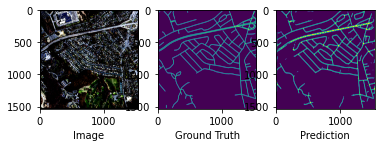

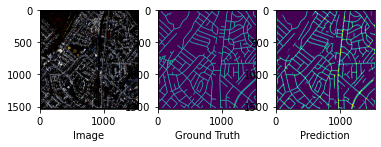

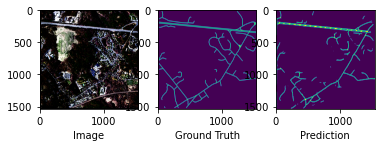

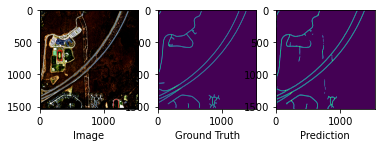

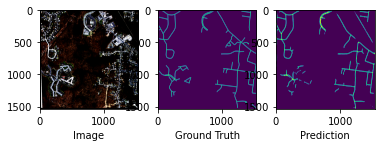

...

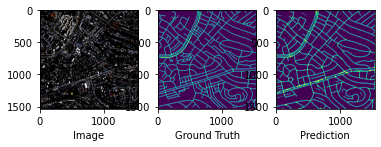

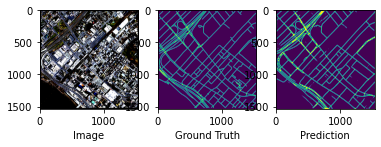

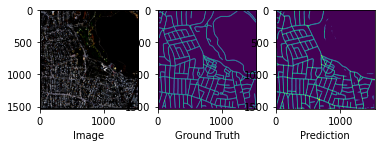

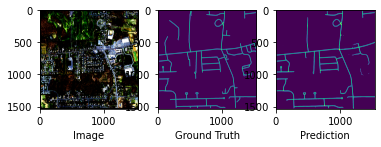

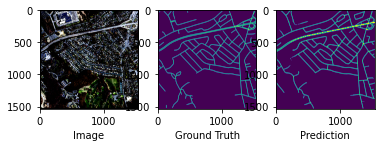

In [16]:
train_loss_values = []
valid_loss_values = []
train_iou_values = []
valid_iou_values = []

for epoch in range(200):
    loop = tqdm(train_loader)
    train_losses = []
    train_iou = []
    # training_loop
    model.train()
    for batch_id, (images, masks) in enumerate(loop):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float().unsqueeze(1)
        
        outputs = model(images)['out']
        

        loss = criterion(outputs, masks)
        train_losses.append(loss.item())
        
        iou = mIoU(outputs, masks)
        train_iou.append(iou)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loop.set_postfix(train_loss=loss.item(), train_miou=iou)
        
    # Validation loop    
    model.eval()
    valid_losses = []
    valid_iou = []

    with torch.no_grad():
        loop = tqdm(valid_loader)
        for i, (images, masks) in enumerate(loop):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            masks = masks.float().unsqueeze(1)

            outputs = model(images)['out']
            
            if (epoch+1) % 10 == 0:
                img = images[0].permute(1, 2, 0).cpu()
                mask = masks[0].squeeze(0).cpu()
                preds = torch.sigmoid(outputs)
                preds = (preds > 0.5).float()
                pred = preds[0].cpu().squeeze(0)

                plot_images(img, mask, pred)
            
            val_loss = criterion(outputs, masks)
            valid_losses.append(val_loss.item())

            val_iou = mIoU(outputs, masks)
            valid_iou.append(val_iou)
            
            loop.set_postfix(valid_loss=val_loss.item(), valid_miou=val_iou)
                
        
        
    scheduler.step()
        
    train_loss_values.append(np.mean(train_losses))
    valid_loss_values.append(np.mean(valid_losses))
    train_iou_values.append(np.mean(train_iou))
    valid_iou_values.append(np.mean(valid_iou))
    
    
    if (epoch+1) % 10 == 0:
        torch.save(model.state_dict(), "deeplabv3_cosine.pt")
        
        
        
        
    print(f"Epoch-{epoch+1} Train mean loss: {np.mean(train_losses):.4f} Train MIOU: {np.mean(train_iou):.4f}")
    print(f"Epoch-{epoch+1} Valid mean loss: {np.mean(valid_losses):.4f} Valid MIOU: {np.mean(valid_iou):.4f}")

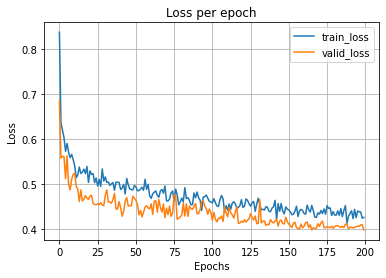

In [17]:
#Plotting Loss
plt.plot(train_loss_values, label='train_loss')
plt.plot(valid_loss_values, label='valid_loss')
plt.title('Loss per epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

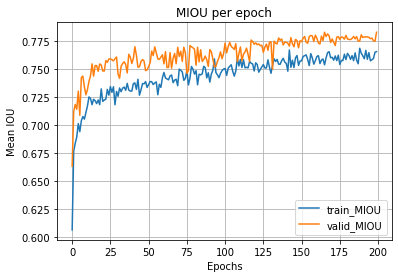

In [18]:
# Plotting Mean IOU
plt.plot(train_iou_values, label='train_MIOU')
plt.plot(valid_iou_values, label='valid_MIOU')
plt.title('MIOU per epoch')
plt.xlabel('Epochs')
plt.ylabel('Mean IOU')
plt.legend()
plt.grid()
plt.show()

In [16]:
# inference_model = ConvMixer_UNET_down(CLASSES).to(DEVICE)
# Image size=1536
weights = torch.load("deeplabv3_cosine.pt")
model.load_state_dict(weights)



def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy


model.eval()
with torch.no_grad():
    total_list = []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).squeeze(1).long()
        
        outputs = model(images)['out']
        miou_list = mIoU(pred_mask = outputs, mask=masks, n_classes=2) 
        total_list.append(miou_list)
print(np.mean(total_list))

  0%|          | 0/25 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 25/25 [00:08<00:00,  2.85it/s]

0.7951623796255183


In [16]:
# inference_model = ConvMixer_UNET_down(CLASSES).to(DEVICE)
# Image size=1504
weights = torch.load("deeplabv3_cosine.pt")
model.load_state_dict(weights)



def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy


model.eval()
with torch.no_grad():
    total_list = []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).squeeze(1).long()
        
        outputs = model(images)['out']
        miou_list = mIoU(pred_mask = outputs, mask=masks, n_classes=2) 
        total_list.append(miou_list)
print(np.mean(total_list))

  0%|          | 0/25 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 25/25 [00:10<00:00,  2.47it/s]

0.8002839069976001


In [17]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor
unnorm = UnNormalize(mean=[0.4299, 0.4328, 0.3964], std=[0.2711, 0.2666, 0.2816])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

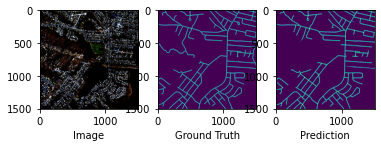

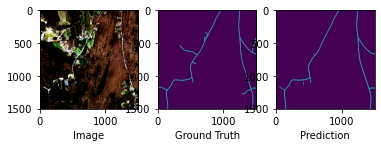

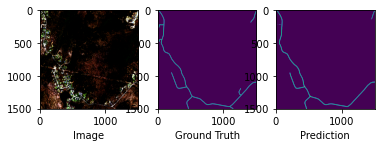

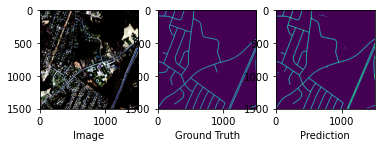

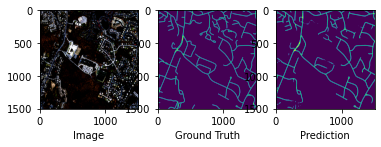

...

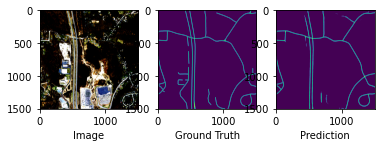

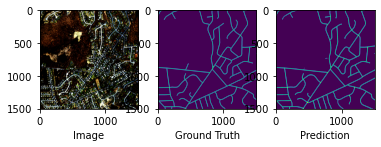

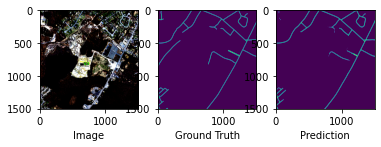

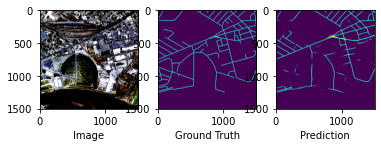

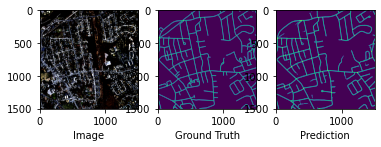

In [19]:
with torch.no_grad():
    model.eval()
    folder = 'Image_results/DeeplabV3'
    for i, data in enumerate(test_set):
        images, masks = data
        images = images.unsqueeze(0).to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float()

        outputs = model(images)['out']

        img = images.squeeze(0).permute(1, 2, 0).cpu()
        mask = masks.squeeze(0).cpu()
        preds = torch.sigmoid(outputs)
        preds = (preds > 0.5).float()
        pred = preds[0].cpu().squeeze(0)
        pred[pred == 1] = 255
        
        image = unnorm(images)
        torchvision.utils.save_image(image, f"{folder}/image_{i}.png")
        torchvision.utils.save_image(masks, f"{folder}/mask_{i}.png")
        torchvision.utils.save_image(pred, f"{folder}/pred_{i}.png")

        plot_images(img, mask, pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


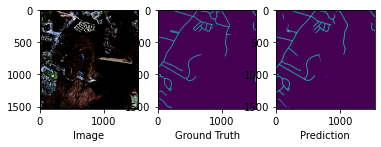

In [21]:
with torch.no_grad():
    model.eval()
    images, masks = test_set[20]
    images = images.unsqueeze(0).to(DEVICE)
    masks = masks.to(DEVICE)
    masks = masks.float()

    outputs = model(images)['out']

    img = images.squeeze(0).permute(1, 2, 0).cpu()
    mask = masks.squeeze(0).cpu()
    preds = torch.sigmoid(outputs)
    preds = (preds > 0.5).float()
    pred = preds[0].cpu().squeeze(0)

    plot_images(img, mask, pred)

In [18]:
# Image Size = 1536
import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images)['out'].squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 25/25 [01:08<00:00,  2.72s/it]

 MIOU: 0.7954379525081358, P: 0.8836228251457214, R: 0.8648409843444824, F1: 0.872383713722229


In [20]:
# Image Size = 1504
import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images)['out'].squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 25/25 [01:09<00:00,  2.79s/it]

 MIOU: 0.7979904322047308, P: 0.8913814425468445, R: 0.8660253882408142, F1: 0.8766915798187256
